In [1]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 15679, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 15679 (delta 1), reused 2 (delta 0), pack-reused 15672
Receiving objects: 100% (15679/15679), 14.39 MiB | 26.08 MiB/s, done.
Resolving deltas: 100% (10747/10747), done.


In [2]:
%cd /content/yolov5

/content/yolov5


In [3]:
!pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 586.5/586.5 kB 26.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 205.1/205.1 kB 24.6 MB/s eta 0:00:00


In [4]:
!gdown --id 1qPSHg77jxQ5Sn5Au7yq3d9amTg0Cwurl

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1qPSHg77jxQ5Sn5Au7yq3d9amTg0Cwurl
To: /content/yolov5/ATM-Person-Model.zip
100% 35.3M/35.3M [00:01<00:00, 21.3MB/s]


In [5]:
!unzip /content/yolov5/ATM-Person-Model.zip

Archive:  /content/yolov5/ATM-Person-Model.zip
   creating: ATM-Person/exp2/
  inflating: ATM-Person/exp2/confusion_matrix.png  
  inflating: ATM-Person/exp2/events.out.tfevents.1684319642.b7dfa31379d8.631.0  
  inflating: ATM-Person/exp2/F1_curve.png  
  inflating: ATM-Person/exp2/hyp.yaml  
  inflating: ATM-Person/exp2/labels.jpg  
  inflating: ATM-Person/exp2/labels_correlogram.jpg  
  inflating: ATM-Person/exp2/opt.yaml  
  inflating: ATM-Person/exp2/P_curve.png  
  inflating: ATM-Person/exp2/PR_curve.png  
  inflating: ATM-Person/exp2/R_curve.png  
  inflating: ATM-Person/exp2/results.csv  
  inflating: ATM-Person/exp2/results.png  
  inflating: ATM-Person/exp2/train_batch0.jpg  
  inflating: ATM-Person/exp2/train_batch1.jpg  
  inflating: ATM-Person/exp2/train_batch2.jpg  
  inflating: ATM-Person/exp2/val_batch0_labels.jpg  
  inflating: ATM-Person/exp2/val_batch0_pred.jpg  
  inflating: ATM-Person/exp2/val_batch1_labels.jpg  
  inflating: ATM-Person/exp2/val_batch1_pred.jpg  
  

In [6]:
!mkdir runs

In [7]:
import shutil
dest = shutil.move("/content/yolov5/ATM-Person/exp2", "/content/yolov5/runs", copy_function = shutil.copytree)

In [8]:
from google.colab import files
files.upload() #upload kaggle.json
!pip install -q kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!ls ~/.kaggle
!chmod 600 /root/.kaggle/kaggle.json
!kaggle datasets download -d mehantkammakomati/atm-anomaly-video-dataset-atmav
!unzip atm-anomaly-video-dataset-atmav.zip 

Saving kaggle.json to kaggle.json
kaggle.json
 99% 293M/297M [00:02<00:00, 170MB/s]
100% 297M/297M [00:02<00:00, 154MB/s]
Archive:  atm-anomaly-video-dataset-atmav.zip
  inflating: ATMA-V Dataset/labels/labels.txt  
  inflating: ATMA-V Dataset/videos/10.mp4  
  inflating: ATMA-V Dataset/videos/11.mp4  
  inflating: ATMA-V Dataset/videos/12.mp4  
  inflating: ATMA-V Dataset/videos/13.mp4  
  inflating: ATMA-V Dataset/videos/14.mp4  
  inflating: ATMA-V Dataset/videos/15.mp4  
  inflating: ATMA-V Dataset/videos/16.mp4  
  inflating: ATMA-V Dataset/videos/17.mp4  
  inflating: ATMA-V Dataset/videos/18.mp4  
  inflating: ATMA-V Dataset/videos/19.mp4  
  inflating: ATMA-V Dataset/videos/20.mp4  
  inflating: ATMA-V Dataset/videos/21.mp4  
  inflating: ATMA-V Dataset/videos/22.mp4  
  inflating: ATMA-V Dataset/videos/23.mp4  
  inflating: ATMA-V Dataset/videos/24.mp4  
  inflating: ATMA-V Dataset/videos/25.mp4  
  inflating: ATMA-V Dataset/videos/27.mp4  
  inflating: ATMA-V Dataset/videos/2

In [15]:
!python detect.py --source '/content/yolov5/ATMA-V Dataset/videos/14.mp4' --weights /content/yolov5/runs/exp2/weights/best.pt   #--conf 0.05

detect: weights=['/content/yolov5/runs/exp2/weights/best.pt'], source=/content/yolov5/ATMA-V Dataset/videos/14.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /usr/local/lib/python3.10/dist-packages/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-168-gec2b853 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/642) /content/yolov5/ATMA-V Dataset/videos/14.mp4: 384x640 2 persons, 1 zatm, 42.1ms
video 1/1 (2/642) /content/yolov5/ATMA-V Dataset/videos/14.mp4: 384x640 1 person, 1 zatm, 7.8ms
video 1/1 (3/642) /c

In [11]:
!pip install mediapy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 24.9 MB/s eta 0:00:00


Shape is (num_images, height, width, num_channels) = (737, 284, 290, 3).
Framerate is 30.0 frames/s.


""

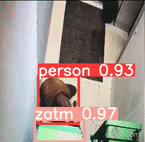

In [12]:
import mediapy as media
import numpy as np
video2 = media.read_video("/content/yolov5/runs/detect/exp2/3.mp4")
print(f'Shape is (num_images, height, width, num_channels) = {video2.shape}.')
print(f'Framerate is {video2.metadata.fps} frames/s.')
video2 = media.resize_video(video2, np.array(video2.shape[1:3]) // 2)
media.show_video(video2, fps=30, codec='gif')